# Анализ рынка заведений общепита Москвы

## Описание проекта

**Задача** - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. Исследование поможет инвесторам определиться с типом заведения, расположением, меню и ценами.

**Описание данных**

Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках

Файл **`moscow_places.csv`**:
- `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например *«кафе»*, *«пиццерия»* или *«кофейня»*;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах;
* `price` — категория цен в заведении, например *«средние»*, *«ниже среднего»*, *«выше среднего»*;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»;
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»;
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым:
    * `0` — заведение не является сетевым
    * `1` — заведение является сетевым
* `district` — административный район, в котором находится заведениег;
* `seats` — количество посадочных мест.

**Ход исследования**:
1. *Загрузка данных и изучение общей информации* 
---  
2. *Предобработка данных*
---
3. *Анализ данных*:
* `категории заведений`:
    * исследование количества объектов общественного питания по категориям 
    * расчет средних рейтингов по категориям заведений
    * исследование количества посадочных мест в местах по категориям.

* `сетевые заведения`:
    * исследование соотношения сетевых и несетевых заведений в датасете
    * исследование сетевых категорий заведений
    * топ-15 популярных сетей в Москве
* `улицы Москвы`
    * исследование самых популярных улиц по количеству заведений
    * изучение улиц, на которых находится только один объект общепита 

* `районы Москвы`
    * исследуем распределение общего количества заведений и количества заведений каждой категории по районам
    * геоаналитика:
        * изучить распределение средних рейтингов заведений по районам Москвы.
        * изучить распределение значений средних чеков по районам Москвы   
---
4. *Открытие кофейни*
    
* исследовать имеющиеся кофейни - районы и особенности расположения
* провести анализ режима работы кофеен
* изучить рейтинги кофеен, среднюю стоимость чашки кофе и их распределение рейтингов по районам

## Загрузка и знакомство с данными

In [1]:
import pandas as pd
import numpy as np
import datetime as dt

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

import folium
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
from folium import Map, Marker, Choropleth

import json
import warnings

In [2]:
pio.renderers.default = "png"
warnings.filterwarnings(action='ignore')
pd.options.display.max_colwidth = 100

In [3]:
try:
    msc_plcs = pd.read_csv('data_story/moscow_places.csv')
except:
    msc_plcs = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
try:
    with open('data_story/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

In [5]:
msc_plcs.sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1669,ПаПан,кафе,"Москва, Петровско-Разумовский проезд, 24, корп. 4",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–21:00",55.803239,37.563706,4.4,NaN,NaN,NaN,NaN,0,NaN
5683,Старая крепость,быстрое питание,"Москва, Вяземская улица, 26А",Западный административный округ,"пн-пт 13:00–04:00; сб,вс 13:00–05:00",55.710550,37.404828,4.2,средние,Средний счёт:500–1500 ₽,1000.0,NaN,0,NaN
1248,Суши Wok,кафе,"Москва, посёлок Рублёво, улица Василия Ботылёва, 14А",Западный административный округ,"ежедневно, 10:00–23:00",55.787938,37.355651,4.5,NaN,NaN,NaN,NaN,1,NaN


In [6]:
msc_plcs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [7]:
msc_plcs.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Для удобства, переименуем значение `быстрое питание` в `фастфуд`

In [8]:
msc_plcs['category'] = msc_plcs['category'].replace({'быстрое питание' : 'фастфуд'})

In [9]:
msc_plcs.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [10]:
msc_plcs.hours.unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [11]:
msc_plcs.price.unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [12]:
msc_plcs.avg_bill.nunique()

897

Формат столбца `seats` - `float`, перевести в `int` не получится, поскольку есть пропущенные значения.

Ознакомимся со значениями, применив метод `describe`:

In [13]:
msc_plcs.seats.describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Максимальное значение посадочных мест - 1288. Это могут быть как выбросы, так и заведения с огромными банкетными залами. Минимальное значение 0 тоже может оказаться выбросом, с другой стороны, вреоятно, это заведения работающие только на вынос.

Рассмотрим данные поподробнее в соответствующем разделе.

In [14]:
msc_plcs.rating.describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Значения от 1 до 5, все в порядке.

In [15]:
msc_plcs.middle_avg_bill.describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Минимальное и максимальное значения среднего счета - 0 и 35000 рублей. Вероятно, в данных есть выбросы с обеих сторон.

In [16]:
msc_plcs.middle_coffee_cup.describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Максимальное значение стоимости чашки кофе - 1568 рублей. Вероятно, в данных есть выбросы.

## Предобработка данных

*Проверка дубликатов в данных.*

In [17]:
msc_plcs.duplicated().sum()

0

Дубликатов нет.

### пропуски

Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [18]:
# рассчитаем процент пропусков в столбцах
(
    pd.DataFrame(round(msc_plcs.isna().mean() * 100, 2), columns=["nan_rate"])
    .sort_values(by="nan_rate", ascending=False)
    .T
    .replace(0,np.nan).dropna(axis=1,how="all")
    .style
    .set_precision(1)
    .background_gradient(axis = None, cmap='YlOrRd')
)

,middle_coffee_cup,middle_avg_bill,price,avg_bill,seats,hours
nan_rate,93.6,62.5,60.6,54.6,43.0,6.4


Имеются пропуски в стоблцах:
* `middle_coffee_cup` - 93.6%,
* `middle_avg_bill`	- 62.5%,
* `price` - 60.6%,
* `avg_bill` - 54.6%,
* `seats` - 43.0%,
* `hours` - 6.4%.

Пропуски в столбцах `hours` и `seats` обработать никоим образом не получится. Удалять их также нельзя - много данных, поэтому оставляем.

Заполнение пропусков, либо удаление строк с пропусками из остальных столбцов также не представляется возможным

### новые столбцы

**Добавим стоблец `street`**

In [19]:
n = msc_plcs['address'].str.split(',', expand = True)
msc_plcs['street'] = n[1]

In [20]:
msc_plcs.sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
2645,На Ночь Жрать,пиццерия,"Москва, 3-я Парковая улица, 57",Восточный административный округ,"ежедневно, 10:00–23:00",55.805547,37.780894,4.4,NaN,NaN,NaN,NaN,0,NaN,3-я Парковая улица
396,Франклинс Бургер,ресторан,"Москва, Сходненская улица, 56",Северо-Западный административный округ,"ежедневно, 10:00–22:00",55.849996,37.443366,4.4,NaN,Средний счёт:200–400 ₽,300.0,NaN,1,140.0,Сходненская улица
7525,Чайхана,кафе,"Москва, МКАД, 14-й километр, 2, стр. 1",Юго-Восточный административный округ,"ежедневно, 07:00–19:00",55.652335,37.832219,4.0,NaN,NaN,NaN,NaN,1,NaN,МКАД


добавим **столбец 24/7**

In [21]:
msc_plcs[msc_plcs['hours'].str.contains('ежедневно, круглосуточно',na = False)].sample(4)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
3229,Drive Café,кафе,"Москва, Кутузовский проспект, 52",Западный административный округ,"ежедневно, круглосуточно",55.730866,37.483566,4.3,NaN,NaN,NaN,NaN,1,NaN,Кутузовский проспект
1616,Ма Ми,кафе,"Москва, Вятская улица, 27, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.796907,37.581882,4.7,средние,Средний счёт:от 500 ₽,500.0,NaN,0,50.0,Вятская улица
1647,Ресторан 29 Park Lane,ресторан,"Москва, Петровско-Разумовский проезд, 29",Северный административный округ,"ежедневно, круглосуточно",55.803999,37.561894,4.4,высокие,Средний счёт:2000–3000 ₽,2500.0,NaN,0,60.0,Петровско-Разумовский проезд
2617,Бол Бол ФУД,пиццерия,"Москва, Щёлковское шоссе, 45А",Восточный административный округ,"ежедневно, круглосуточно",55.810199,37.787790,4.2,средние,Средний счёт:200–300 ₽,250.0,NaN,0,40.0,Щёлковское шоссе


In [22]:
msc_plcs['is_24/7'] = (
    np.where(
        msc_plcs['hours']
        .str.contains(
            'ежедневно, круглосуточно', 
            case=False, na=False
        ), 
        'True', 
        'False'
    )
)

In [23]:
msc_plcs.sample(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2043,Кулинарная лавка братьев Караваевых,кафе,"Москва, Краснопролетарская улица, 16, стр. 1",Центральный административный округ,"ежедневно, 08:00–23:00",55.776992,37.607127,4.3,средние,Средний счёт:400–500 ₽,450.0,NaN,1,45.0,Краснопролетарская улица,False
2897,Семейное кафе,кафе,"Москва, Мироновская улица, 25",Восточный административный округ,NaN,55.787912,37.732836,3.9,NaN,NaN,NaN,NaN,1,50.0,Мироновская улица,False


### Аномалии

**Посадочные места**

Во время знакомства с данными мы столкнулись, вероятно, с аномально большими и нулевыми значениями в количестве посадочных мест.

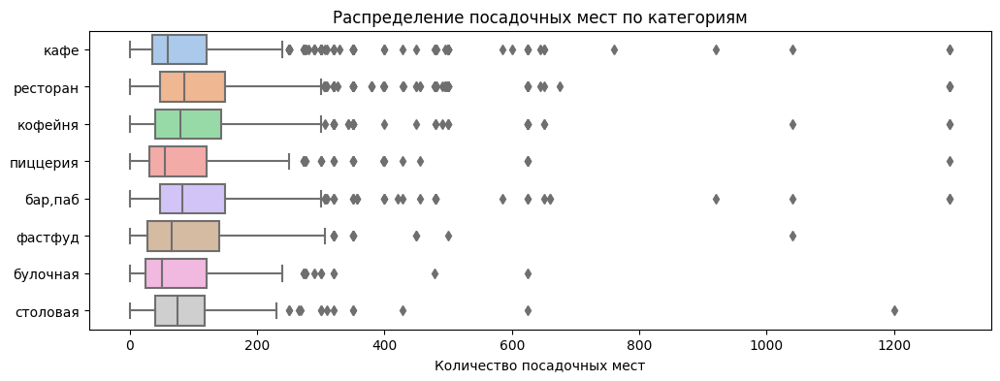

In [24]:
plt.figure(figsize=(12, 4))
sns.boxplot(data = msc_plcs
            , x= 'seats', y= 'category' 
            , palette = 'pastel')
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Количество посадочных мест')
plt.ylabel('')

plt.show();

Большая часть значений лежит в пределах 25-150 посадочных мест, но также имеются заведения с запредельно большим количеством посадочных мест.

Ознакомимся с данными заведениями.

In [25]:
msc_plcs.query('seats > 900')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0,Измайловское шоссе,False
2722,Маргарита,фастфуд,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0,Измайловское шоссе,False
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00–05:00; вс 11:00–23:00",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0,Измайловское шоссе,False
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0,Измайловское шоссе,False
4180,Eataly,"бар,паб","Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 12:00–23:00",55.743405,37.562535,4.6,NaN,NaN,NaN,NaN,0,920.0,Киевская улица,False
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0,Кутузовский проспект,False
4245,Стейк & Бургер,кафе,"Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 09:00–21:00",55.742953,37.561872,4.2,NaN,NaN,NaN,NaN,1,920.0,Киевская улица,False
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0,проспект Вернадского,True
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,проспект Вернадского,False
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False


В глаза бросаются одинаковые адреса и одинаково большое количество посадочных мест у некоторых заведений. Вероятно, это огромные фудкорты, на которых расположено сразу несколько заведений.

Рассчитаем как распределяются все заведения датасета по адресам.

Примем, что если: 
* по одному адресу расположено более 5 заведений - это фудкорт,
* по одному адресу расположено от 2 до 5 заведений - это отдельные заведения в одном здании.


In [26]:
seats_adress_distr = (
    msc_plcs
    .groupby('address')
    .agg({'name':'count'})
    .sort_values(by= 'name', ascending = False)
)

print(seats_adress_distr.query('name > 5')['name'].count(),'- заведений в фудкортах')
print(seats_adress_distr.query('1< name <= 5')['name'].count(), '- заведений по несколько штук на одно здание')
print(seats_adress_distr.query('name == 1')['name'].count(), '- одиночных заведений')

98 - заведений в фудкортах
1259 - заведений по несколько штук на одно здание
4396 - одиночных заведений


Рассмотрим это же распеделение внутри запроса по аномальным количествам посадочных мест, то есть более 250.

In [27]:
seats_anomaly = (
    msc_plcs
    .query('seats > 250')
    .groupby('address')
    .agg({'name':'count'})
    .sort_values(by= 'name', ascending = False)
)

print(seats_anomaly.query('name > 5')['name'].count(),'- заведений в фудкортах')
print(seats_anomaly.query('1< name <= 5')['name'].count(), '- заведений по несколько штук на одно здание')
print(seats_anomaly.query('name == 1')['name'].count(), '- одиночных заведений')
print('Итого:', seats_anomaly.shape[0], '- количество заведений с аномально большим количеством посадочных мест\
, что составляет', round((seats_anomaly.shape[0]/ msc_plcs.shape[0])*100,2),\
'% от общего количества заведений в датасете' )


13 - заведений в фудкортах
51 - заведений по несколько штук на одно здание
115 - одиночных заведений
Итого: 179 - количество заведений с аномально большим количеством посадочных мест, что составляет 2.13 % от общего количества заведений в датасете


Таким образом, причинами аномально высоких значений количества посадочных мест могут быть:
* объединение количества посадочных мест среди заведений расположенных в одном месте, например, фудкорты,
* сами заведения с аномально высокими количествами посадочных мест, например, банкетные залы,
* ошибка в данных.

Далее рассмотрим заведения с нулевым количеством посадочных мест.

In [28]:
seats_zero = msc_plcs.query('seats == 0')
print(seats_zero.shape[0], '- количество заведений без посадочных мест\
, что составляет', round((seats_zero.shape[0]/ msc_plcs.shape[0])*100,2),\
'% от общего количества заведений в датасете' )

136 - количество заведений без посадочных мест, что составляет 1.62 % от общего количества заведений в датасете


Заведения без посадочных мест - заведения работающие навынос, например, киоски с кофе и выпечкой рядом с метро, либо, опять же - ошибки в данных. 

Поскольку, расмотренные данные можно вынести в отдельные подкатегории, то следовало бы уточнить у заказчика, рассматривает ли он открытие точек, работающих только навынос, либо заведений на сотни человек.

Поскольку у нас этих данных очень мало и даже те, что есть, вероятно, с ошибками, рекомендую их удалить.

In [29]:
msc_plcs.shape

(8406, 16)

In [30]:
msc_plcs= msc_plcs.query('seats != 0')

In [31]:
msc_plcs.shape

(8270, 16)

In [32]:
anomal_seats = msc_plcs.query('seats >= 250')['seats']
msc_plcs = msc_plcs.query('seats not in @anomal_seats')

In [33]:
msc_plcs.shape

(7799, 16)

## Анализ данных

Для того чтобы выявить особенности рынка заведений общепита Москвы, декомпозируем исследование на несколько исследований поменьше:
* исследуем имеющиеся категории заведений,
* рассмотрим особенности сетевых заведений,
* определим самые популярные улицы,
* ознакомимся с распределением заведений по административным районам Москвы.

Далее, обобщим выводы, полученные в ходе исследования и выдадим рекомендации заказчику.

### Категории

#### категории заведений в данных

*Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.*

In [34]:
msc_plcs.sample(1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3776,Север,"бар,паб","Москва, Страстной бульвар, 4, стр. 3",Центральный административный округ,пн-чт 14:00–00:00; пт 14:00–04:00; сб 14:00–03:00; вс 14:00–00:00,55.764878,37.608475,4.0,NaN,NaN,NaN,NaN,0,90.0,Страстной бульвар,False


In [35]:
# количество объектов общественного питания по категориям
cat_count = (
    msc_plcs
    .groupby('category', as_index=False)
    .agg({'name': 'count'})
    .sort_values(by = 'name', ascending = False)
)
# доля
cat_count['rate']= round(cat_count['name']/cat_count['name'].sum()*100,2)
cat_count

,category,name,rate
2,кафе,2235,28.66
5,ресторан,1875,24.04
3,кофейня,1310,16.80
0,"бар,паб",706,9.05
4,пиццерия,591,7.58
7,фастфуд,551,7.07
6,столовая,297,3.81
1,булочная,234,3.00


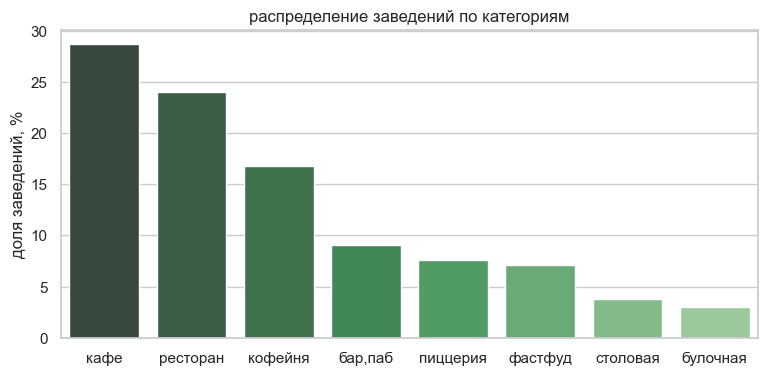

In [36]:
plt.figure(figsize=(9, 4))

sns.set(style="whitegrid")
rank = cat_count['name'].argsort().argsort()

pal = sns.color_palette("Greens_d", len(cat_count['name']))
pal.reverse()

sns.barplot(
     x = 'category'
    ,y = 'rate'
    ,data = cat_count
    ,palette = np.array(pal[::-1])[rank]
)

plt.title('распределение заведений по категориям')
plt.xlabel('')
plt.ylabel('доля заведений, %')

plt.show();

Наибольшее количество заведений среди представленных категорий относится к кафе и ресторанам - 24-27%. Кофеен - 16%, баров, фастфудных и пиццерий - 7-8%. Столовых и булочных меньше всего - 3-4%.

#### рейтинги по категориям

In [37]:
rating_cat = msc_plcs.groupby('category', as_index= False).agg({'rating': ['mean', 'median']}).round(1)
#
#
rating_cat.columns = rating_cat.columns.droplevel()
rating_cat.columns = ['category','mean_rating', 'median_rating']
rating_cat = rating_cat.sort_values(by = 'median_rating', ascending = False)
rating_cat

,category,mean_rating,median_rating
0,"бар,паб",4.4,4.4
1,булочная,4.3,4.3
3,кофейня,4.3,4.3
4,пиццерия,4.3,4.3
5,ресторан,4.3,4.3
6,столовая,4.2,4.3
2,кафе,4.1,4.2
7,фастфуд,4.1,4.2


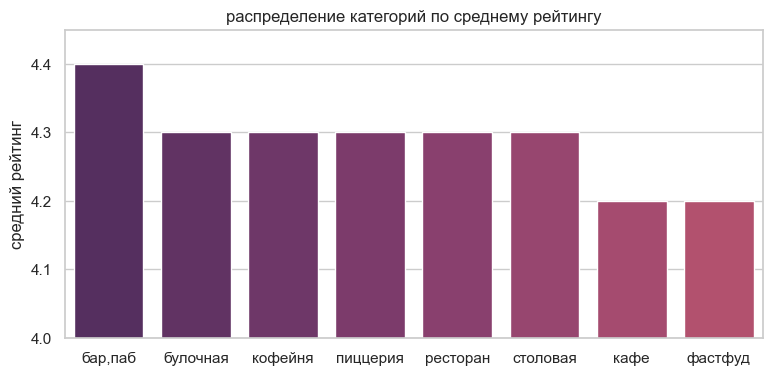

In [38]:
plt.figure(figsize=(9, 4))
col= sns.color_palette("flare_r",15)

sns.barplot(
     x = 'category'
    ,y = 'median_rating'
    ,data = rating_cat
    ,palette= col
)

plt.title('распределение категорий по среднему рейтингу')
plt.xlabel('')
plt.ylabel('средний рейтинг')
plt.ylim(4.0, 4.45)
plt.show();

Средний ретийнг среди всех категорий приблизительно одинаковый - значения в пределах 4.2-4.4.

#### посадочные места

In [39]:
# расчет медианного количества посадочных мест по категориям
seats_cnt = (
    msc_plcs
    .groupby('category', as_index=False)
    .agg({'seats': 'median'})
    .sort_values(by = 'seats', ascending = False)
)
seats_cnt

,category,seats
5,ресторан,80.0
0,"бар,паб",74.0
6,столовая,71.0
3,кофейня,70.0
7,фастфуд,60.0
2,кафе,56.0
1,булочная,50.0
4,пиццерия,50.0


Рассмотрим распределение количества посадочных мест по категориям заведений.

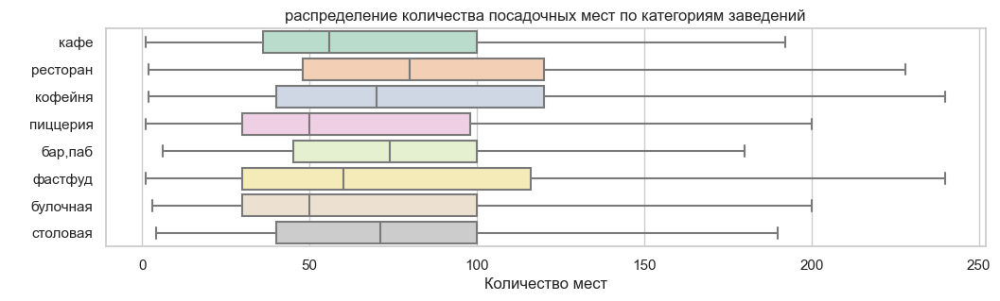

In [40]:
plt.figure(figsize=(12, 3))
sns.boxplot(x= 'seats', y= 'category'
            , data=msc_plcs 
            , palette='Pastel2'
            , showfliers= False)

plt.title('распределение количества посадочных мест по категориям заведений')
plt.xlabel('Количество мест')
plt.ylabel(' ') 

plt.show()

Большая часть значений лежит в пределах 25-150 посадочных мест.

Рассмотрим средние значения посадочных мест в разбивке по категориям

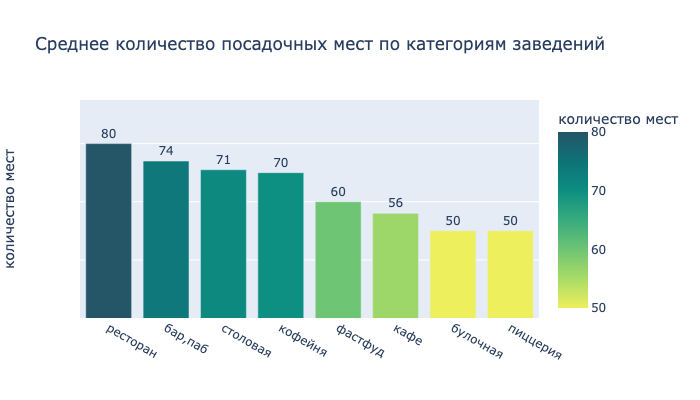

In [41]:
fig = px.bar(seats_cnt
             , x='category', y='seats'
             , color='seats'
             , color_continuous_scale= px.colors.sequential.Aggrnyl_r
             , height=400
             , text= 'seats'
             , labels={
                     "category": "",
                     "seats": "количество мест",
                 },
                title="Среднее количество посадочных мест по категориям заведений")

fig.update_layout(yaxis=dict(range=[20, 95]))
fig.update_traces(textposition='outside')
fig.update_yaxes(showticklabels=False)

fig.show()

Лидерами по среднему количеству посадочных мест являются категории- рестораны, бары и, как ни странно, кофейни - в среднем - от 70 и более посадочных мест. В среднем, меньше всего посадочных мест в булочных - до 50.

### Сетевые заведения

#### соотношение сетевых и несетевых заведений в датасете

In [42]:
chain_cnt= msc_plcs.chain.value_counts().reset_index().replace({0:'локальное', 1: 'сетевое'})
chain_cnt

,index,chain
0,локальное,4864
1,сетевое,2935


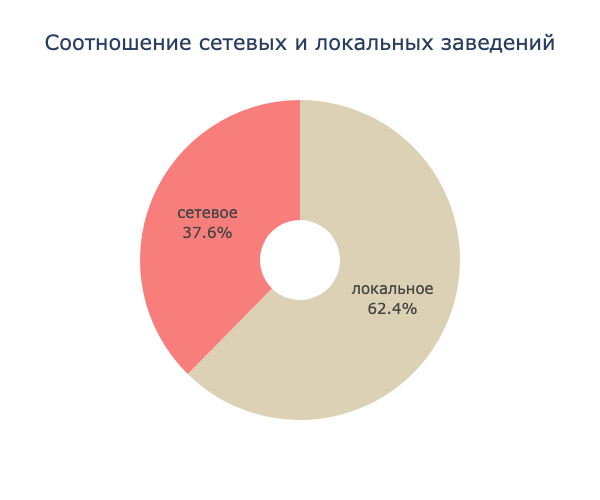

In [43]:
fig = go.Figure(data=[go.Pie(
    labels=chain_cnt['index']
    , values=chain_cnt['chain']
    , hole= 0.25
    , textinfo='label+percent'
    , marker_colors = ('#DCD1B4', '#F87E7B')
)])

fig.update_layout(title_text= 'Соотношение сетевых и локальных заведений'
                  , font_size=15, title_x= 0.5)
fig.update_layout(showlegend= False)
fig.update_layout(autosize= False,
                  width= 600, height= 500)

fig.show()

Локальных заведений чуть более, чем в полтора раза больше, чем сетевых.

In [44]:
# рассчитаем распределение сетевых и локальных заведений по категориям
chain_cat= (
    msc_plcs
    .groupby(['category', 'chain'], as_index= False)
    .agg({'name': 'count'})
    .replace({0:'локальное', 1: 'сетевое'})
)
chain_cat

,category,chain,name
0,"бар,паб",локальное,544
1,"бар,паб",сетевое,162
2,булочная,локальное,89
3,булочная,сетевое,145
4,кафе,локальное,1512
5,кафе,сетевое,723
6,кофейня,локальное,650
7,кофейня,сетевое,660
8,пиццерия,локальное,286
9,пиццерия,сетевое,305


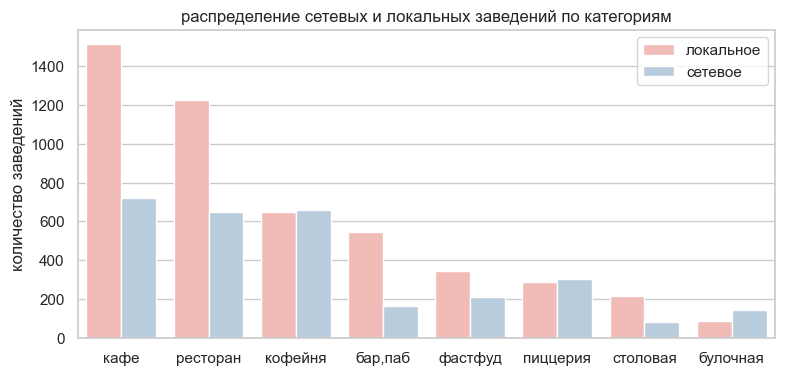

In [45]:
plt.figure(figsize=(9, 4))
sns.set_style('whitegrid')
ax = sns.barplot(  x = 'category'
            , y = 'name'
            , hue = 'chain'
            , data = chain_cat.sort_values(by = 'name', ascending= False)
            , palette = 'Pastel1'
)
plt.title('распределение сетевых и локальных заведений по категориям')
plt.xlabel('')
plt.ylabel('количество заведений')
plt.legend(title= '')

plt.show();

Данная визуализация предоставляет более полную картину соотношений между сетевыми и локальными заведениями.

Локальных кафе, ресторанов, баров, фастфудных и столовых в 2-3 раза больше, чем сетевых.

Иная ситуация наблюдается среди сетевых кофеен и пиццерий - их столько же, сколько и сетевых, а также среди сетевых булочных - их в 1.5 раза больше, чем локальных.

#### сетевые категории заведений

In [46]:
chain1_cat = (
    msc_plcs
    .query('chain == 1')
    .groupby('category', as_index = False)['name'].count()
)
chain1_cat['total']= (
    msc_plcs
    .groupby('category', as_index=False)
    .agg({'chain': 'count'})['chain']
)
chain1_cat['rate_chain']= round((chain1_cat['name']/chain1_cat['total'])*100,2)
chain1_cat['rate_local'] = 100 - chain1_cat['rate_chain']

chain1_cat

,category,name,total,rate_chain,rate_local
0,"бар,паб",162,706,22.95,77.05
1,булочная,145,234,61.97,38.03
2,кафе,723,2235,32.35,67.65
3,кофейня,660,1310,50.38,49.62
4,пиццерия,305,591,51.61,48.39
5,ресторан,648,1875,34.56,65.44
6,столовая,84,297,28.28,71.72
7,фастфуд,208,551,37.75,62.25


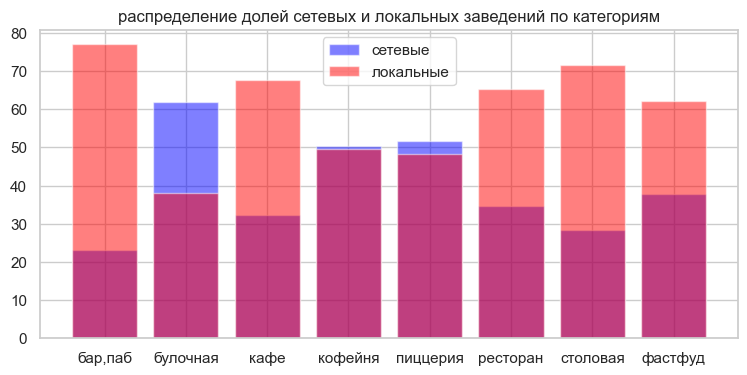

In [47]:
plt.figure(figsize=(9, 4))
plt.bar(chain1_cat['category'], chain1_cat['rate_chain'], 
        color='blue', label='сетевые', alpha= 0.5)

plt.bar(chain1_cat['category'], chain1_cat['rate_local'], 
        color='red', label='локальные', alpha= 0.5)

plt.title('распределение долей сетевых и локальных заведений по категориям')
plt.legend()
plt.show();

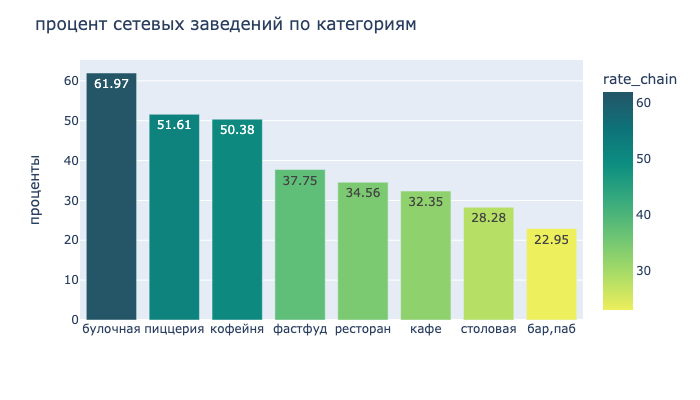

In [48]:
fig = px.bar(chain1_cat.sort_values(by = 'rate_chain', ascending= False)
             , x='category', y='rate_chain'
             , color='rate_chain'
             , color_continuous_scale= px.colors.sequential.Aggrnyl_r
             , text= 'rate_chain'
             , height=400)

fig.update_layout(
    title="процент сетевых заведений по категориям"
    , xaxis_title= ""
    , yaxis_title= "проценты"
)

fig.show()

Чаще всего, сетевыми становятся булочные (60%), а так же пиццерии и кофейни (по 50%).

#### топ-15 популярных сетей в Москве

In [49]:
# топ-15 популярных сетей
chain_top15 = (
    msc_plcs
    .query('chain == 1')
    .groupby('name', as_index = False).agg({'address': 'count'
                                           ,'category': 'max'})
    .sort_values(by = 'address', ascending = False)
    .head(15)
)
chain_top15.rename(columns= {'address': 'quant'}, inplace= True)
display(chain_top15)

# топ 15 сетей по категориям
chain_top15_cat = chain_top15.groupby('category', as_index= False).agg({'quant':'sum'})
chain_top15_cat

,name,quant,category
734,Шоколадница,112,кофейня
337,Домино'с Пицца,74,пиццерия
333,Додо Пицца,69,пиццерия
143,One Price Coffee,62,кофейня
747,Яндекс Лавка,61,ресторан
56,Cofix,61,кофейня
165,Prime,47,ресторан
669,Хинкальная,42,фастфуд
371,КОФЕПОРТ,40,кофейня
424,Кулинарная лавка братьев Караваевых,37,кафе


,category,quant
0,кафе,61
1,кофейня,338
2,пиццерия,143
3,ресторан,108
4,фастфуд,109


In [50]:
chain_top15['name'] = chain_top15['name'].replace({'Кулинарная лавка братьев Караваевых' : 'лавка Караваевых'})

In [51]:
chain_top15= chain_top15.sort_values(by= 'quant')

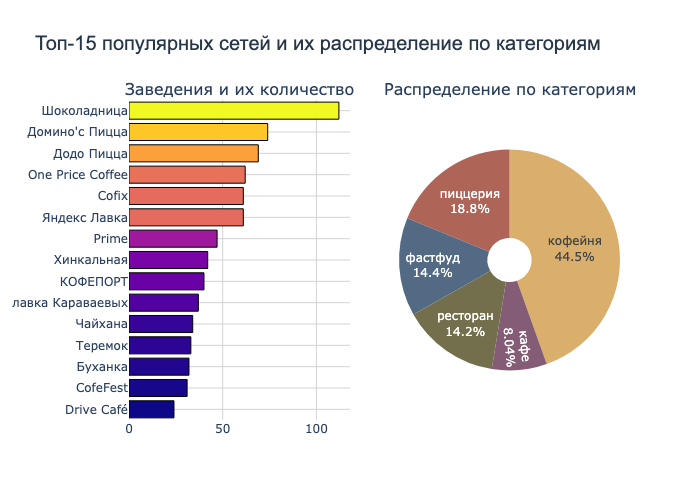

In [52]:
specs = [[{'type':'bar'}, {"type": "pie"}]]
fig = make_subplots(rows=1, cols=2, 
                    specs=specs, shared_yaxes = True,
                    subplot_titles=['Заведения и их количество',
                                    'Распределение по категориям'])
x = chain_top15['quant']
y = chain_top15['name']
                    
fig.add_trace(go.Bar(
                        x = x,
                        y = y,
                        orientation = 'h',
                        marker={'cmax': 80, 'cmin': 30,
                                'color': x, 'colorscale': 'Plasma'},    
                        marker_line=dict(width=1, color='black')
                        ),1,1)


fig.add_trace(go.Pie(
                            labels = chain_top15_cat['category'], 
                            values = chain_top15_cat['quant'],
                            hole = 0.2,
                            textinfo='label+percent',
                            marker_colors = px.colors.qualitative.Antique,
                            ), 1, 2)  

fig.update_layout(showlegend=False, 
                  title=dict(text="Топ-15 популярных сетей и их распределение по категориям",
                             font=dict(
                                        family="Arial",
                                        size=20,
                                        color='#283747')
                    ))
fig.update_layout(plot_bgcolor= 'white')
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')


fig.show()

Среди топ-15 популярных сетей около половины (44.5%) приходится на кофейни, 19% на пиццерии, по 14% на пиццерии и 8% на фастфуд.

### Улицы Москвы

#### топ-15 улиц

In [53]:
# топ-15 улиц по количеству заведений
top15_streets = (
    msc_plcs
    .groupby(['street'], as_index= False)
    .agg({'name': 'count'})
    .sort_values(by = 'name', ascending = False)
    .head(15)
    .rename(columns = {'name': 'quant'})
)
top15_streets

,street,quant
1081,проспект Мира,152
767,Профсоюзная улица,117
520,Ленинский проспект,92
1078,проспект Вернадского,92
518,Ленинградский проспект,72
368,Дмитровское шоссе,71
295,Варшавское шоссе,69
519,Ленинградское шоссе,69
450,Каширское шоссе,66
545,МКАД,65


In [54]:
# распределение заведений на топ-15 улиц по категориям
cat_top15_streets = (
    msc_plcs[
        msc_plcs['street']
        .isin(top15_streets['street'])
    ]
    .groupby(['street', 'category'], as_index= False)
    .agg({'name': 'count'})
)
cat_top15_streets.columns = ['street', 'category', 'quant']
cat_top15_streets

,street,category,quant
0,Алтуфьевское шоссе,"бар,паб",4
1,Алтуфьевское шоссе,булочная,1
2,Алтуфьевское шоссе,кафе,12
3,Алтуфьевское шоссе,кофейня,9
4,Алтуфьевское шоссе,пиццерия,3
...,...,...,...
106,улица Миклухо-Маклая,кафе,20
107,улица Миклухо-Маклая,кофейня,4
108,улица Миклухо-Маклая,пиццерия,2
109,улица Миклухо-Маклая,ресторан,14


In [55]:
# расчет долей категорий заведений на каждой из топ-15 улиц
cat_top15_streets= cat_top15_streets.merge(top15_streets, on= 'street', how= 'left')
cat_top15_streets['rate']= round(
    cat_top15_streets['quant_x']/cat_top15_streets['quant_y']*100,1)

In [56]:
cat_top15_streets

,street,category,quant_x,quant_y,rate
0,Алтуфьевское шоссе,"бар,паб",4,44,9.1
1,Алтуфьевское шоссе,булочная,1,44,2.3
2,Алтуфьевское шоссе,кафе,12,44,27.3
3,Алтуфьевское шоссе,кофейня,9,44,20.5
4,Алтуфьевское шоссе,пиццерия,3,44,6.8
...,...,...,...,...,...
106,улица Миклухо-Маклая,кафе,20,47,42.6
107,улица Миклухо-Маклая,кофейня,4,47,8.5
108,улица Миклухо-Маклая,пиццерия,2,47,4.3
109,улица Миклухо-Маклая,ресторан,14,47,29.8


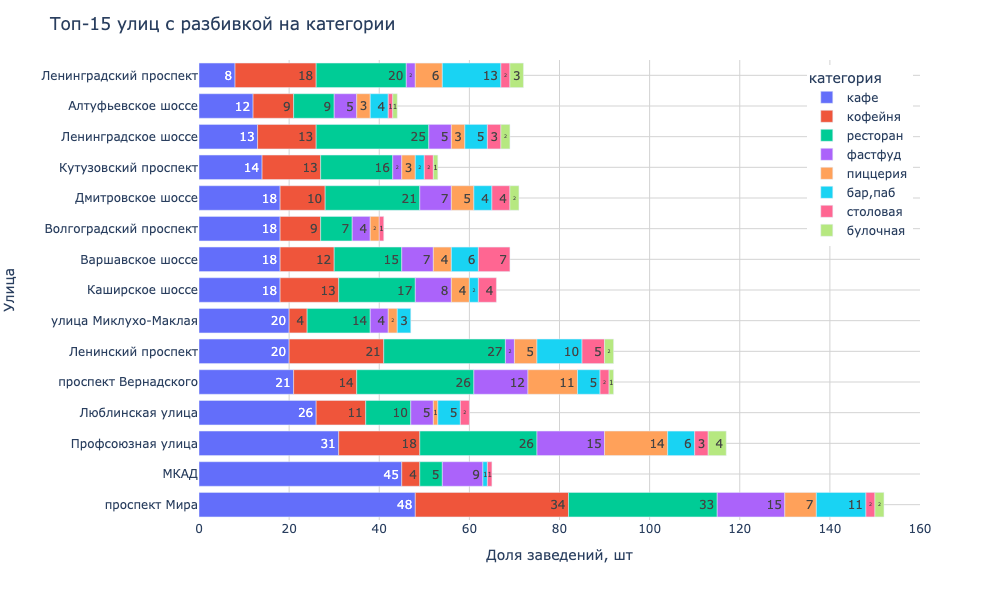

In [57]:
fig = px.bar(
    cat_top15_streets.sort_values(by = 'quant_x', ascending= False)
    , x= 'quant_x' , y= 'street' 
    , color= 'category'
    , height = 600
    , width = 1000
    , text = 'quant_x'
    , labels={"quant_x": "Доля заведений, шт",
              "street": "Улица",
              "category": "категория"}
)
fig.update_layout(title_text= 'Топ-15 улиц с разбивкой на категории', showlegend = True)
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="right",
    x=0.99
))
fig.update_traces(textposition='inside')
fig.update_layout(plot_bgcolor= 'white')
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')

fig.show()

Если считать за популярность количество заведений на улице, то наиболее популярными улицами являются улицы большой протяженности - проспекты и шоссе. Почти на каждой такой улице подавляющее большинство заведений - кафе, вероятно, придорожные. Выявить зависимости или особенности не получается.

#### одинокие заведения

*Исследуем улицы, на которых находится только один объект общепита*

In [58]:
one_srteet_one_place= (
    msc_plcs
    .groupby('street', as_index= False)
    .agg({'address': 'count'
         ,'name': 'max'
         ,'category': 'max'
         ,'lat': 'max' 
         ,'lng': 'max'
         ,'chain': 'max'
         ,'district':'max'
         ,'middle_avg_bill':'max'
         ,'rating':'max'
         ,'seats':'max'})
    .query('address == 1')
)

one_srteet_one_place

,street,address,name,category,lat,lng,chain,district,middle_avg_bill,rating,seats
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,55.704847,37.657065,1,Южный административный округ,270.0,4.2,20.0
1,1-й Балтийский переулок,1,Хуан Хэ,ресторан,55.810418,37.518824,0,Северный административный округ,1750.0,4.4,60.0
2,1-й Варшавский проезд,1,Колизей,кафе,55.648674,37.627979,0,Южный административный округ,NaN,4.0,NaN
3,1-й Вешняковский проезд,1,Deli by Shell,кафе,55.723152,37.794014,0,Юго-Восточный административный округ,NaN,3.4,NaN
5,1-й Голутвинский переулок,1,Shelby,"бар,паб",55.739600,37.613494,0,Центральный административный округ,650.0,4.1,22.0
...,...,...,...,...,...,...,...,...,...,...,...
1427,улица Шкулёва 4,1,CofeFest,кофейня,55.693299,37.749927,1,Юго-Восточный административный округ,NaN,4.4,NaN
1429,улица Шухова,1,Scirocco,ресторан,55.716123,37.608472,0,Южный административный округ,3000.0,4.1,90.0
1432,улица Юннатов,1,Кафе-столовая,столовая,55.802610,37.558759,0,Северный административный округ,325.0,4.7,27.0
1435,улица Яблочкова,1,Буханка,булочная,55.819024,37.577264,1,Северо-Восточный административный округ,NaN,4.5,NaN


Для того, чтобы понять особенности данных заведений, необходимо сравнить эти заведения со всеми остальными.

Создадим еще один датасет, исключающий одиночные заведения.

Далее сравним их по следующим параметрам:
* относительное распределение по категориям,
* относительное распределение по рейтингам,
* среднее количество посадочных мест,
* относительное распределение на сетевые/локальные заведения,
* относительное распределение по районам,
* средние чеки заведений.

In [59]:
one_srteet_place_alot = msc_plcs.query('street not in @one_srteet_one_place')

In [60]:
print('количество одиночных заведений составляет -', 
      round(one_srteet_one_place.shape[0]/one_srteet_place_alot.shape[0]*100,2),
     '% от общего количества заведений')

количество одиночных заведений составляет - 6.03 % от общего количества заведений


**Распределение по категориям**

In [61]:
cat_count_osop= (
    one_srteet_one_place
    .groupby('category', as_index=False)
    .agg({'name':'count'})
    .sort_values(by = 'name')
)
cat_count_osop['rate']= round(cat_count_osop['name']/cat_count_osop['name'].sum()*100,2)

cat_count_ospa= (
    one_srteet_place_alot
    .groupby('category', as_index=False)
    .agg({'name':'count'})
    .sort_values(by = 'name')
)
cat_count_ospa['rate']= round(cat_count_ospa['name']/cat_count_ospa['name'].sum()*100,2)
cat_count_osop

,category,name,rate
1,булочная,8,1.70
4,пиццерия,17,3.62
7,фастфуд,21,4.47
6,столовая,37,7.87
0,"бар,паб",40,8.51
3,кофейня,87,18.51
5,ресторан,96,20.43
2,кафе,164,34.89


In [62]:
cat_count_ospa

,category,name,rate
1,булочная,234,3.00
6,столовая,297,3.81
7,фастфуд,551,7.07
4,пиццерия,591,7.58
0,"бар,паб",706,9.05
3,кофейня,1310,16.80
5,ресторан,1875,24.04
2,кафе,2235,28.66


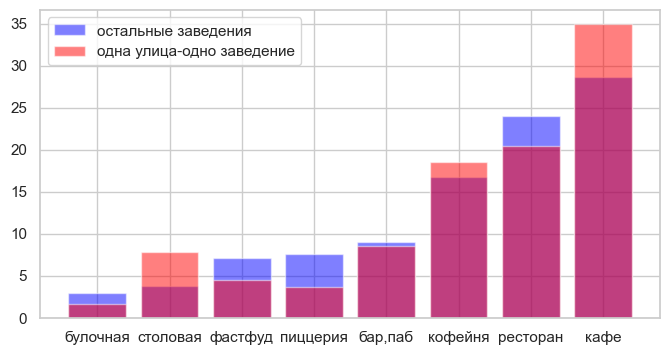

In [63]:
plt.figure(figsize=(8, 4))
plt.bar(cat_count_ospa['category'], cat_count_ospa['rate'], 
        color='blue', label='остальные заведения', alpha= 0.5)

plt.bar(cat_count_osop['category'], cat_count_osop['rate'], 
        color='red', label='одна улица-одно заведение', alpha= 0.5)


plt.legend()
plt.show();

Относительное количество одиночных заведений на 5-7% превышает относительное количество остальных завдений среди категорий "кафе" и "столовая" и на 2% в категории "кофейня".

**Рейтинг заведений**

In [64]:
rating_cat_ospa = (
    one_srteet_place_alot
    .groupby('category', as_index= False)
    .agg({'rating':'median'})
)

rating_cat_osop = (
    one_srteet_one_place
    .groupby('category', as_index= False)
    .agg({'rating':'median'})
)
rating_cat_osop

,category,rating
0,"бар,паб",4.45
1,булочная,4.45
2,кафе,4.20
3,кофейня,4.30
4,пиццерия,4.30
5,ресторан,4.30
6,столовая,4.30
7,фастфуд,4.30


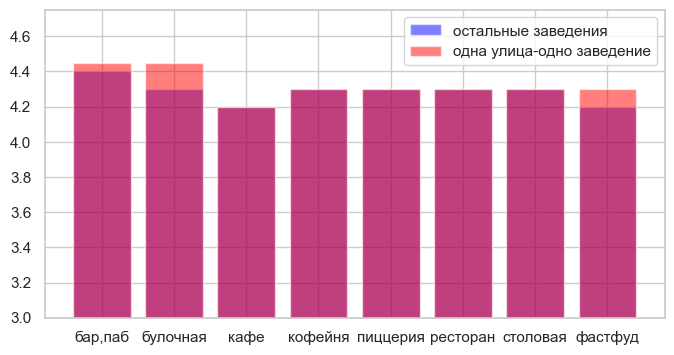

In [65]:
plt.figure(figsize=(8, 4))
plt.bar(rating_cat_ospa['category'], rating_cat_ospa['rating'], 
        color='blue', label='остальные заведения', alpha= 0.5)

plt.bar(rating_cat_osop['category'], rating_cat_osop['rating'], 
        color='red', label='одна улица-одно заведение', alpha= 0.5)
plt.ylim(3,4.75)

plt.legend()
plt.show();

Рейтинги данных заведений схожи

**Количество посадочных мест**

In [66]:
seats_cnt_ospa = (
    one_srteet_place_alot
    .groupby('category', as_index=False)
    .agg({'seats': 'median'})
    .sort_values(by = 'seats', ascending = False)
)

seats_cnt_osop = (
    one_srteet_one_place
    .groupby('category', as_index=False)
    .agg({'seats': 'median'})
    .sort_values(by = 'seats', ascending = False)
)
seats_cnt

,category,seats
5,ресторан,80.0
0,"бар,паб",74.0
6,столовая,71.0
3,кофейня,70.0
7,фастфуд,60.0
2,кафе,56.0
1,булочная,50.0
4,пиццерия,50.0


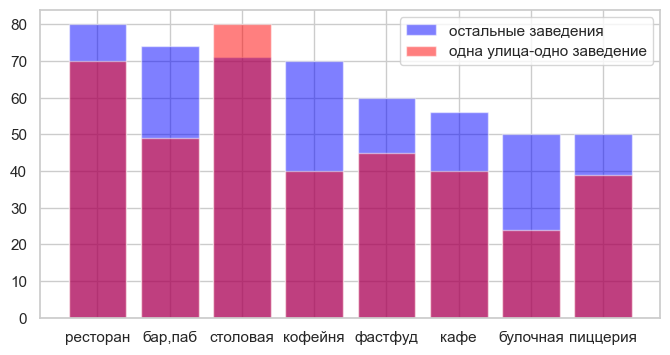

In [67]:
plt.figure(figsize=(8, 4))
plt.bar(seats_cnt_ospa['category'], seats_cnt_ospa['seats'], 
        color='blue', label='остальные заведения', alpha= 0.5)

plt.bar(seats_cnt_osop['category'], seats_cnt_osop['seats'], 
        color='red', label='одна улица-одно заведение', alpha= 0.5)

plt.legend()
plt.show();

Среднее количество посадочных мест в одиночных заведениях на 10-40% меньше, чем в остальных заведениях. Это говорит о том,что в целом, данные заведения неблольшого размера.

**Сетевые/локальные заведения**

In [68]:
chain_ospa = (
    one_srteet_place_alot
    .groupby('chain', as_index= False)
    .agg({'name':'count'})
)
chain_ospa['rate']= round(chain_ospa['name']/chain_ospa['name'].sum()*100,2)
chain_ospa['chain']=chain_ospa['chain'].replace({0:'локальное', 1: 'сетевое'})

chain_osop= (
    one_srteet_one_place
    .groupby('chain', as_index= False)
    .agg({'name':'count'}))
chain_osop['rate']= round(chain_osop['name']/chain_osop['name'].sum()*100,2)
chain_osop['chain']=chain_osop['chain'].replace({0:'локальное', 1: 'сетевое'})
chain_osop

,chain,name,rate
0,локальное,338,71.91
1,сетевое,132,28.09


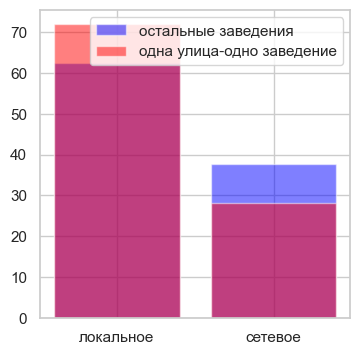

In [69]:
plt.figure(figsize=(4, 4))
plt.bar(chain_ospa['chain'], chain_ospa['rate'], 
        color='blue', label='остальные заведения', alpha= 0.5)

plt.bar(chain_osop['chain'], chain_osop['rate'], 
        color='red', label='одна улица-одно заведение', alpha= 0.5)

plt.legend()
plt.show();

Относительное распределение среди локальных/сетевых заведений в целом одинаковое.

**Административные районы**

In [70]:
distr_ospa =(
    one_srteet_place_alot
    .groupby('district', as_index= False)
    .agg({'name':'count'})
)
distr_ospa['rate']= round(distr_ospa['name']/distr_ospa['name'].sum()*100,2)

distr_osop =(
    one_srteet_one_place
    .groupby('district', as_index= False)
    .agg({'name':'count'})
)
distr_osop['rate']= round(distr_osop['name']/distr_osop['name'].sum()*100,2)

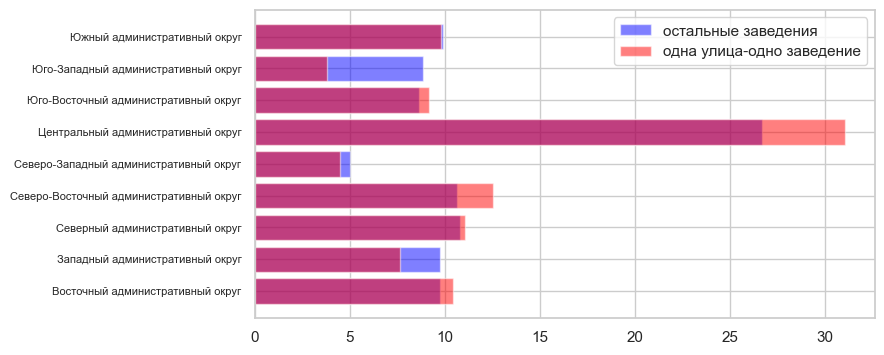

In [71]:
plt.figure(figsize=(8, 4))
plt.barh(distr_ospa['district'], distr_ospa['rate'], 
        color='blue', label='остальные заведения', alpha= 0.5)

plt.barh(distr_osop['district'], distr_osop['rate'], 
        color='red', label='одна улица-одно заведение', alpha= 0.5)


plt.yticks(fontsize= 8)
plt.legend()
plt.show();

Одиночных заведений на 5% больше в ЦАО и на 5% меньше в ЮЗАО, чем остальных заведений. В остальных районах разница составляет не более 2%.

**Средний чек**

In [72]:
avg_bill_ospa= (
    one_srteet_place_alot
    .groupby('category', as_index= False)
    .agg({'middle_avg_bill':'median'})
)

avg_bill_osop= (
    one_srteet_one_place
    .groupby('category', as_index= False)
    .agg({'middle_avg_bill':'median'})
)
avg_bill_osop

,category,middle_avg_bill
0,"бар,паб",1250.0
1,булочная,NaN
2,кафе,500.0
3,кофейня,475.0
4,пиццерия,600.0
5,ресторан,1250.0
6,столовая,275.0
7,фастфуд,450.0


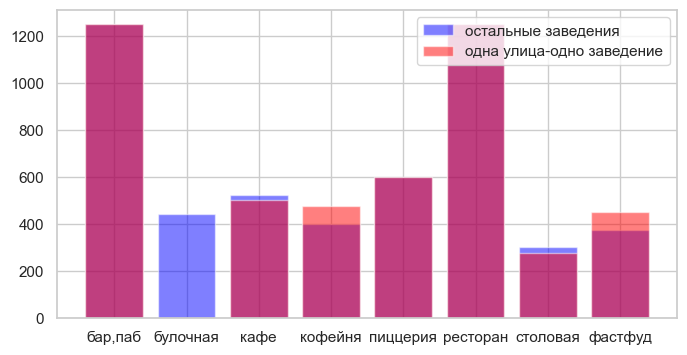

In [73]:
plt.figure(figsize=(8, 4))
plt.bar(avg_bill_ospa['category'], avg_bill_ospa['middle_avg_bill'], 
        color='blue', label='остальные заведения', alpha= 0.5)

plt.bar(avg_bill_osop['category'], avg_bill_osop['middle_avg_bill'], 
        color='red', label='одна улица-одно заведение', alpha= 0.5)

plt.legend()
plt.show();

Среди средних чеков также не видно ощутимой разницы (среди одинкоих булочных нет данных о среднем чеке)

Сравнив данные одиноких заведений и всех остальных, можно сделать вывод, что критических  различий среди них нет.

Причиной одиночества данных заведений могут быть:
* маленькая проходимость улиц, непопулярные маршруты, то есть низкий спрос,
* настолько маленький размер улицы, что открыть заведение можно только в одном доме,
* запреты на открытие заведений общепита в соседних домах,
* новый район, в котором еще не успели открыться заведения.

###  районы Москвы

#### Общая информация

Исследуем распределение общего количества заведений и количества заведений каждой категории по районам

In [74]:
dstr_cat_count = (
    msc_plcs
    .groupby(['district', 'category'], as_index= False)
    .agg({'name': 'count'})
)

dstr_count= (
    msc_plcs
    .groupby('district', as_index= False)
    .agg({'name': 'count'}).rename(columns= {'name':'quant'})
)

dstr_cat_count.columns= ['district', 'category', 'quant']

dstr_cat_count= dstr_cat_count.merge(dstr_count, on= 'district', how= 'left')

# считаем относительное количество заведений каждой категории по районам
dstr_cat_count['rate']= round(
    dstr_cat_count['quant_x']/dstr_cat_count['quant_y']*100,1)

dstr_cat_count

,district,category,quant_x,quant_y,rate
0,Восточный административный округ,"бар,паб",45,759,5.9
1,Восточный административный округ,булочная,24,759,3.2
2,Восточный административный округ,кафе,257,759,33.9
3,Восточный административный округ,кофейня,100,759,13.2
4,Восточный административный округ,пиццерия,70,759,9.2
...,...,...,...,...,...
67,Южный административный округ,кофейня,104,772,13.5
68,Южный административный округ,пиццерия,63,772,8.2
69,Южный административный округ,ресторан,166,772,21.5
70,Южный административный округ,столовая,39,772,5.1


In [75]:
dstr_cat_count.district.unique()

array(['Восточный административный округ',
       'Западный административный округ',
       'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

In [76]:
# переименуем районы для удобства
dstr_cat_count['district'] = (
    dstr_cat_count['district']
    .replace({'Восточный административный округ': 'ВАО'
             ,'Западный административный округ': 'ЗАО'
             ,'Северный административный округ': 'САО'
             ,'Центральный административный округ': 'ЦАО'
             ,'Южный административный округ': 'ЮАО'},
            regex= True)
)

dstr_cat_count['district'] = (
    dstr_cat_count['district']
    .replace({'Северо-ЗАО': 'СЗАО'
             ,'Северо-ВАО': 'СВАО'
             ,'Юго-ВАО': 'ЮВАО'
             ,'Юго-ЗАО': 'ЮЗАО'},
            regex= True)
)

In [77]:
dstr_cat_count.district.unique()

array(['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'],
      dtype=object)

Чтобы лучше понимать картину, построим два графика - относительное количество заведений по категориям в каждом из районов и распределение количества заведений по районам с разбивкой на категории

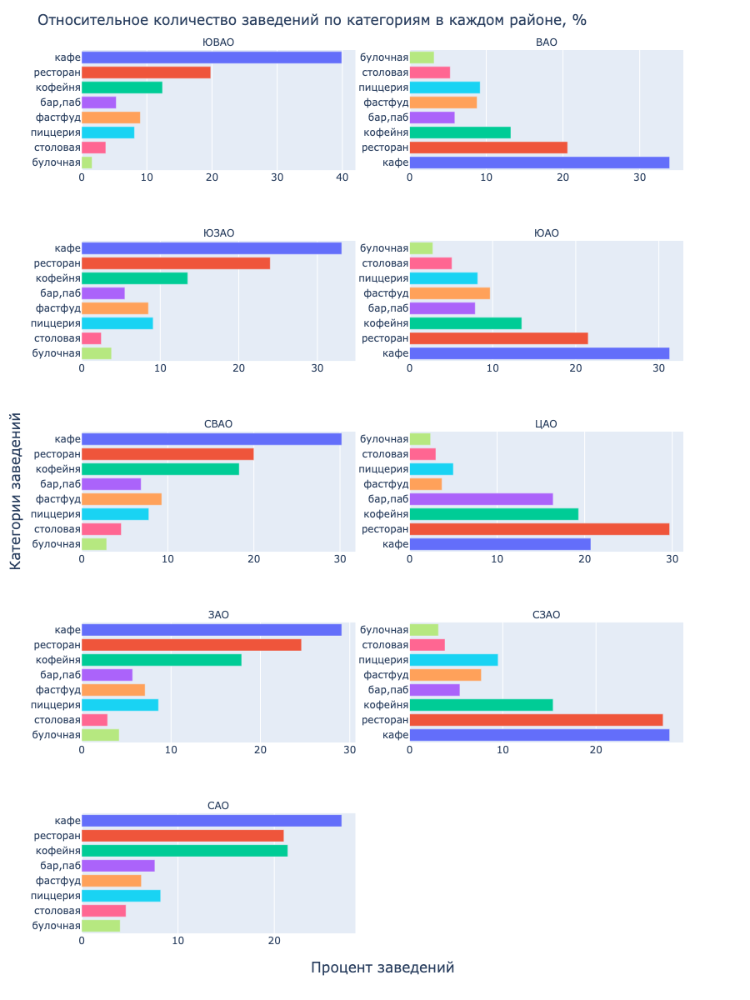

In [78]:
#var1
fig = px.bar(
    dstr_cat_count.sort_values(by = 'rate', ascending= False)
    , x= 'rate' , y= 'category' 
    , color= 'category'
    , height = 1200
    , width = 900
    , facet_col= 'district'
    , facet_col_wrap=2 # разбиваем на колонки
    , facet_row_spacing=0.08 
    , facet_col_spacing=0.09
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_xaxes(matches=None)
fig.update_yaxes(matches=None)
fig.update_xaxes(showticklabels=True)
fig.update_yaxes(showticklabels=True)

fig.for_each_xaxis(lambda x: x.update(title = '')) # убираем подписи в оси Х
fig.add_annotation(x= 0.5, y= -0.05,
                   text= 'Процент заведений', textangle= 0, font = dict(size = 17),
                   xref= "paper", yref= "paper", showarrow= False)

fig.for_each_yaxis(lambda y: y.update(title = '')) # убираем подписи в оси У
fig.add_annotation(x= -0.13,y= 0.5,
                   text= "Категории заведений", textangle= -90, font = dict(size = 17),
                   xref= "paper", yref= "paper", showarrow= False)

fig.update_layout(showlegend = False)
fig.update_layout(title_text= 'Относительное количество заведений по категориям в каждом районе, %')

fig.show()

Три категории являются лидерами в каждом из районов - кафе,рестораны и кофейни. В ЦАО в лидеры также выбиваются бары. Остальных категорий в ЦАО < 5%.

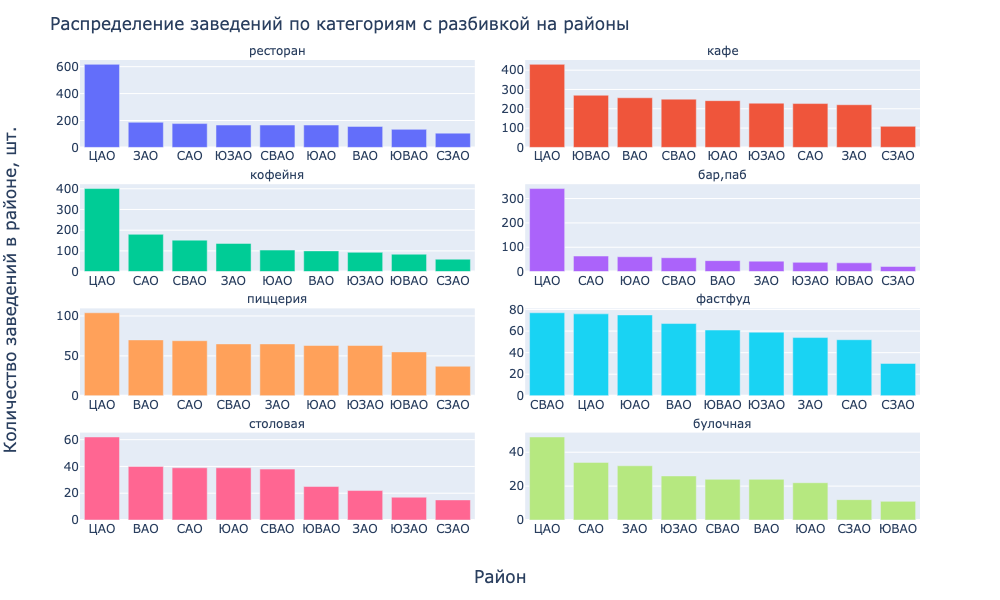

In [79]:
# визуализация распределения заведений по категориям с разбивкой на районы
fig = px.bar(
    dstr_cat_count.sort_values(by = 'quant_x', ascending= False)
    , x= 'district' , y= 'quant_x' 
    , color= 'category'
    , height = 600
    , width = 1000
    , facet_col= 'category' #
    , facet_col_wrap=2 # разбиваем на колонки
    , facet_row_spacing=0.08 
    , facet_col_spacing=0.06 
)


fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_xaxes(matches=None)
fig.update_yaxes(matches=None)
fig.update_xaxes(showticklabels=True)
fig.update_yaxes(showticklabels=True)

fig.for_each_xaxis(lambda x: x.update(title = '')) # убираем подписи в оси Х
fig.add_annotation(x= 0.5, y= -0.15,
                   text= 'Район', textangle= 0, font = dict(size = 17),
                   xref= "paper", yref= "paper", showarrow= False)

fig.for_each_yaxis(lambda y: y.update(title = '')) # убираем подписи в оси У
fig.add_annotation(x= -0.1,y= 0.5,
                   text= "Количество заведений в районе, шт.", textangle= -90, font = dict(size = 17),
                   xref= "paper", yref= "paper", showarrow= False)

fig.update_layout(showlegend = False)
fig.update_layout(title_text= 'Распределение заведений по категориям с разбивкой на районы')

fig.show()

Если смотреть по количеству заведений на каждый район, то видно, что ЦАО на первом месте в кажой категории, в то время как на последнем - СЗАО. Среди остальных округов, количества заведений распределены более-менее равномерно.

#### все заведения на карте 

*Отобразим все заведения датасета на карте*

In [80]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
msc_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [81]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(msc_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

msc_plcs.apply(create_clusters, axis=1)

# выводим карту
msc_map

#### средний рейтинг и чек

Изучим распределение значений средних рейтингов и чеков заведений по районам Москвы.

In [82]:
msc_dstrct_rating = (
    msc_plcs
    .groupby('district', as_index=False)
    .agg({'rating': 'median'}))

dstrct_avg_bill = (
    msc_plcs.groupby('district', as_index= False)
    .agg({'middle_avg_bill': 'median'})
)
dstrct_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,600.0
1,Западный административный округ,975.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,687.5
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,434.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


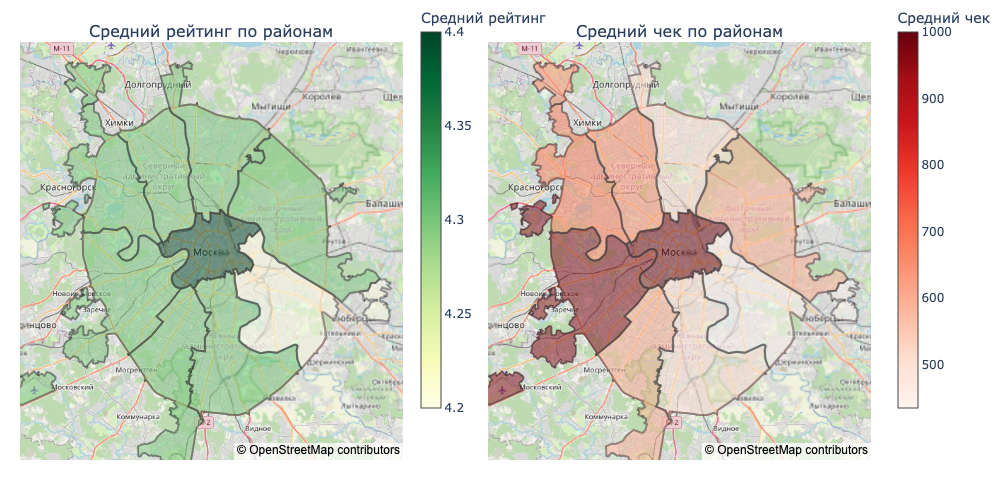

In [83]:
fig = make_subplots(
    rows=1, cols=2, subplot_titles=['Средний рейтинг по районам', 'Средний чек по районам'],
    specs=[[{"type": "mapbox"}, {"type": "mapbox"}]]
)

fig.add_trace(go.Choroplethmapbox(geojson=geo_json, 
                                  locations= msc_dstrct_rating['district'], 
                                  z= msc_dstrct_rating["rating"],
                                  featureidkey="properties.name",
                                  colorscale='YlGn',
                                  colorbar_title = 'Средний рейтинг',
                                  colorbar=dict(thickness=20, x=0.46, y= 0.6),
                                  marker_opacity=0.5, 
                                  marker_line_width=2)
              , row=1, col=1)

fig.add_trace(go.Choroplethmapbox(geojson=geo_json, 
                                  locations= dstrct_avg_bill['district'], 
                                  z= dstrct_avg_bill["middle_avg_bill"],
                                  featureidkey="properties.name",
                                  colorscale='Reds',
                                  colorbar_title = 'Средний чек',
                                  colorbar=dict(thickness=20, x=1.02, y=0.6),
                                  marker_opacity=0.5, 
                                  marker_line_width=2)
              , row=1, col=2)

fig.update_mapboxes(
        style= 'positron',
        bearing=0,
        center = {"lat": 55.751244, "lon": 37.618423},
 )
fig.update_layout(margin={"r":0,"t":40,"l":20,"b":40})

fig.update_layout(mapbox1=dict(zoom=8.5, style='open-street-map'),
                  mapbox2=dict(zoom=8.5, style='open-street-map'))
fig.update_layout(autosize=False, width= 1000, height= 500)

fig.show()

В ЦАО самый высокий средний рейтинг заведений - 4.4, на северо-востоке и юго-востоке самые низкие - 4.2.

Самые дорогие заведения находятся в центре и на западе Москвы, средний чек - 1000 рублей, места подешевле - на северо-востоке и юге Москвы - средний чек в районе 500 рублей.

## Общий вывод

Было произведено исследование и выявление интересных особенностей рынка общественного питания Москвы.

**Категории общепита**

* Наибольшее количество заведений среди представленных категорий относится к кафе и ресторанам - 24-27%. Кофеен - 16%, баров, фастфудных и пиццерий - 7-8%. Столовых и булочных меньше всего - 3-4%.

* Средний рейтинг среди всех категорий приблизительно одинаковый - значения в пределах 4.2-4.4.

* Рассматривая среднее количество посадочных мест в зависимости от категории заведения, выяснили, что, лидерами по среднему количеству посадочных мест являются категории- рестораны, бары и, как ни странно, кофейни - в среднем - от 70 до 80 посадочных мест. Меньше всего посадочных мест в булочных - до 50.

**Сетевые заведения**

* Локальных заведений почти в полтора раза больше, чем сетевых (62% локальных, 38% сетевых).

* Чаще всего, сетевыми становятся булочные (60%), а также пиццерии и кофейни (по 50%).

* Среди топ-15 популярных сетей около половины (44.5%) приходится на кофейни, 19% на пиццерии, по 14% на фастфуд и рестораны и 8% на кафе.

**Улицы Москвы**

* Если считать за популярность количество заведений на улице, то наиболее популярными улицами являются улицы большой протяженности - проспекты и шоссе. Почти на каждой такой улице подавляющее большинство заведений - кафе, вероятно, придорожные. Выявить зависимости или особенности не получается.

* при сравнений заведений, удовлетворяющих условию одна улица - одно заведение, со всеми остальными заведениями, критических различий обнаружено не было:
    * Относительное количество одиночных заведений на 5-7% превышает относительное количество остальных завдений среди категорий "кафе" и "столовая" и на 2% в категории "кофейня".
    * Рейтинги данных заведений схожи
    * Среднее количество посадочных мест в одиночных заведениях на 10-40% меньше, чем в остальных заведениях. Это говорит о том,что в целом, данные заведения неблольшого размера.
    * Разница в относительном распределеним среди локальных/сетевых заведений небольшая - 70% локальных среди одиночных против 60% локальных у всех остальных.
    * Одиночных заведений на 5% больше в ЦАО и на 5% меньше в ЮЗАО, чем остальных заведений. В остальных районах разница составляет не более 2%.
    
**Районы Москвы**

* Три категории являются лидерами в каждом из районов - кафе,рестораны и кофейни. В ЦАО в лидеры также выбиваются бары. Остальных категорий в ЦАО < 5%. Анализ абсолютных значений количества заведений на каждый район показал, что ЦАО на первом месте в каждой категории, в то время как на последнем - СЗАО. Среди остальных округов, количества заведений распределены более-менее равномерно.

* В ЦАО самый высокий средний рейтинг заведений - 4.4, на северо-востоке и юго-востоке самые низкие - 4.2.

* Самые дорогие заведения находятся в центре и на западе Москвы, средний чек - 1000 рублей, места подешевле - на северо-востоке и юге Москвы - средний чек в районе 500 рублей.

## Открытие кофейни

У заказчика есть мечта — открыть такую же крутую и доступную, как «Central Perk» из сериала "Друзья", кофейню в Москве.

Задача - исследовать кофейни имеющегося датасета и выдать рекомендации по поткрытию кофейни. 

---
Ход исследования:
* исследовать имеющиеся кофейни - районы и особенности расположения
* провести анализ режима работы кофеен
* изучить рейтинги кофеен, среднюю стоимость чашки кофе и их распределение рейтингов по районам

---

 Для начала посмотрим, сколько всего кофеен в датасете

In [84]:
msc_plcs.head(1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.47886,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False


In [85]:
print(len(msc_plcs.query('category == "кофейня"')), '- всего кофеен в датасете')

1310 - всего кофеен в датасете


### Расположение кофеен


Для того, чтобы выяснить особенности расположения кофеен в Москве, сравним их абсолютные и относительные количества по администртивным округам Москвы. Оносительное количество кофеен рассчситаем как отношение кофеен округа к общему количеству заведений округа.

In [86]:
coffee_cnt= (
    msc_plcs
    .query('category == "кофейня"')
    .groupby('district', as_index= False)
    .agg({'name': 'count'})
)
coffee_cnt['rate'] = round(coffee_cnt['name']/(msc_plcs
                                         .groupby('district', as_index= False)
                                         .agg({'name':'count'})['name'])*100,2)

coffee_cnt.columns= ['district', 'sum', 'rate']
coffee_cnt

,district,sum,rate
0,Восточный административный округ,100,13.18
1,Западный административный округ,136,17.89
2,Северный административный округ,180,21.38
3,Северо-Восточный административный округ,152,18.34
4,Северо-Западный административный округ,60,15.38
5,Центральный административный округ,401,19.28
6,Юго-Восточный административный округ,84,12.43
7,Юго-Западный административный округ,93,13.46
8,Южный административный округ,104,13.47


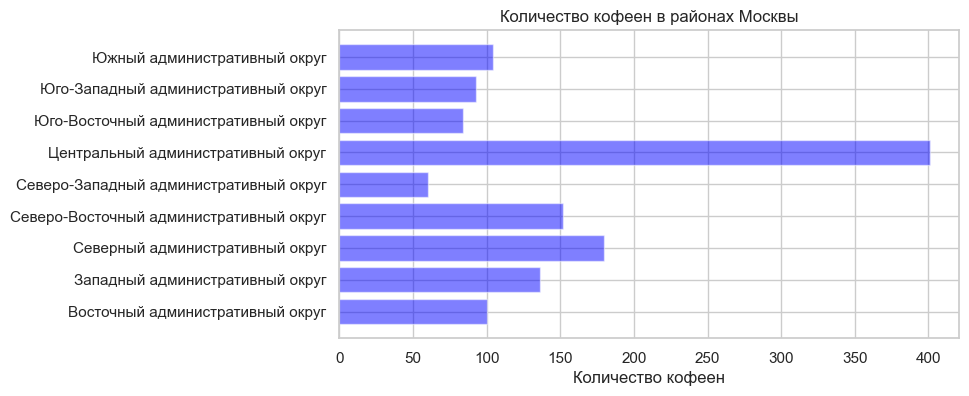

In [87]:
plt.figure(figsize=(8, 4))
plt.barh(coffee_cnt['district']
         , coffee_cnt['sum'], 
        color='blue', alpha= 0.5)

plt.title('Количество кофеен в районах Москвы')
plt.xlabel('Количество кофеен')
plt.show();

Абсолютное большинство кофеен находится в ЦАО - 400 штук. В остальных округах количество кофеен в 2-7 раз меньше.

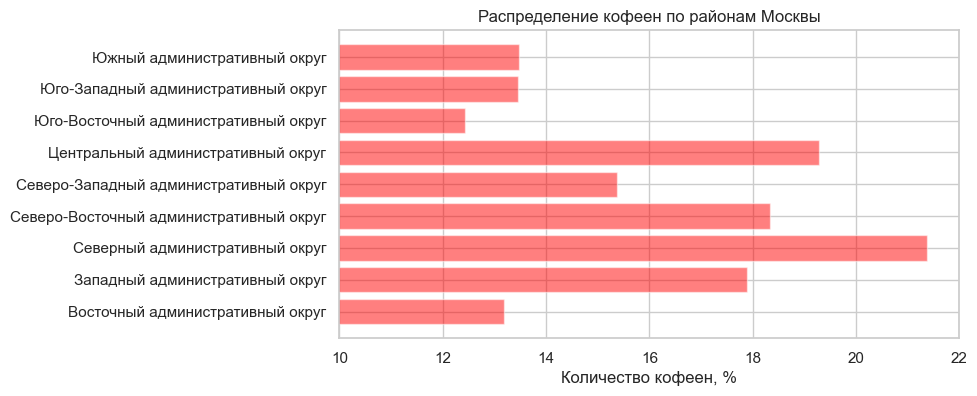

In [88]:
plt.figure(figsize=(8, 4))
plt.barh(coffee_cnt['district']
         , coffee_cnt['rate'], 
        color='red', alpha= 0.5)

plt.xlim(10,22)
plt.title('Распределение кофеен по районам Москвы')
plt.xlabel('Количество кофеен, %')
plt.show();

Иная картина наблюдается при сравнении относительного количества кофеен по округам - на первом месте - САО - 21%. Далее идет ЦАО- 19% и ЗАО/СВАО - по 18%.

### Круглосуточные кофейни

In [89]:
coffee_24_7 = (
    msc_plcs
    .query('category == "кофейня"')
    .groupby('is_24/7', as_index= False)
    .agg({'name':'count'})
    .replace({'True': 'круглосуточно', 'False':'некруглосуточно'})
)
display(coffee_24_7)
print('Круглосуточных кофеен - всего', coffee_24_7['name'][1], 'штук.')

,is_24/7,name
0,некруглосуточно,1254
1,круглосуточно,56


Круглосуточных кофеен - всего 56 штук.


Посмотрим где они расположены

In [90]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


In [91]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
(
    msc_plcs[(msc_plcs['category']=='кофейня') & 
             (msc_plcs['is_24/7']== 'True')]
    .apply(create_clusters, axis=1)
)

# выводим карту
coffee_map

Большая часть круглосуточных кофеен - 22 штуки расположены в центре города, остальные в районе вокзалов и крупных дорог. Единицы находятся внутри спальных районов.

### Средний рейтинг кофеен и средняя цена чашки кофе по районам

In [92]:
coffee_rating_price= (
    msc_plcs
    .query('category == "кофейня"')
    .groupby('district', as_index= False)
    .agg({'rating': 'median', 'middle_coffee_cup': 'median'})
)
coffee_rating_price

,district,rating,middle_coffee_cup
0,Восточный административный округ,4.3,135.0
1,Западный административный округ,4.2,185.0
2,Северный административный округ,4.3,161.0
3,Северо-Восточный административный округ,4.3,166.0
4,Северо-Западный административный округ,4.3,157.0
5,Центральный административный округ,4.3,190.0
6,Юго-Восточный административный округ,4.3,150.0
7,Юго-Западный административный округ,4.3,199.0
8,Южный административный округ,4.3,140.0


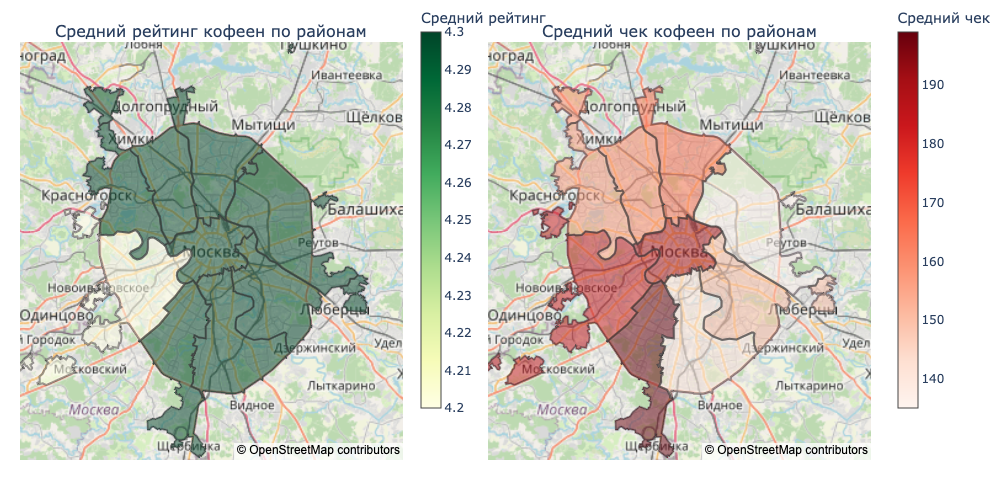

In [93]:
fig = make_subplots(
    rows=1, cols=2, subplot_titles=['Средний рейтинг кофеен по районам', 'Средний чек кофеен по районам'],
    specs=[[{"type": "mapbox"}, {"type": "mapbox"}]]
)

fig.add_trace(go.Choroplethmapbox(geojson=geo_json, 
                                  locations= coffee_rating_price['district'], 
                                  z= coffee_rating_price["rating"],
                                  featureidkey="properties.name",
                                  colorscale='YlGn',
                                  colorbar_title = 'Средний рейтинг',
                                  colorbar=dict(thickness=20, x=0.46, y= 0.6),
                                  marker_opacity=0.5, 
                                  marker_line_width=2)
              , row=1, col=1)

fig.add_trace(go.Choroplethmapbox(geojson=geo_json, 
                                  locations= coffee_rating_price['district'], 
                                  z= coffee_rating_price["middle_coffee_cup"],
                                  featureidkey="properties.name",
                                  colorscale='Reds',
                                  colorbar_title = 'Средний чек',
                                  colorbar=dict(thickness=20, x=1.02, y=0.6),
                                  marker_opacity=0.5, 
                                  marker_line_width=2)
              , row=1, col=2)

fig.update_mapboxes(
        style= 'positron',
        bearing=0,
        center = {"lat": 55.751244, "lon": 37.618423},
 )
fig.update_layout(margin={"r":0,"t":40,"l":20,"b":40})

fig.update_layout(mapbox1=dict(zoom=8.3, style='open-street-map'),
                  mapbox2=dict(zoom=8.3, style='open-street-map'))
fig.update_layout(autosize=False, width= 1000, height= 500)

fig.show()

Средний рейтинг кофеен по районам в целом одинаковый - во всех районах, кроме ЗАО, средний рейтинг 4.3, в ЗАО-4.2. То есть расположение на рейтинг не влияет.

Самый дорогой кофе в юго-западной части москвы- 200 рублей за чашку капучино, немногим дешевле в центре и на западе - 185-190 рублей. Самый дешевый капучино на востоке и на юге Москвы- 135-140 рублей за чашку. В остальных районах - 150-165 рублей за чашку капучино.

### Среднее количество посадочных мест в кофейнях по районам

In [94]:
coffee_seats= (
    msc_plcs.query('category == "кофейня"')
    .groupby('district', as_index= False)
    .agg({'seats': 'median'})
    .sort_values(by= 'seats')
)
coffee_seats

,district,seats
8,Южный административный округ,50.0
0,Восточный административный округ,55.0
6,Юго-Восточный административный округ,59.0
2,Северный административный округ,60.0
7,Юго-Западный административный округ,64.0
3,Северо-Восточный административный округ,72.5
1,Западный административный округ,80.0
5,Центральный административный округ,80.0
4,Северо-Западный административный округ,94.0


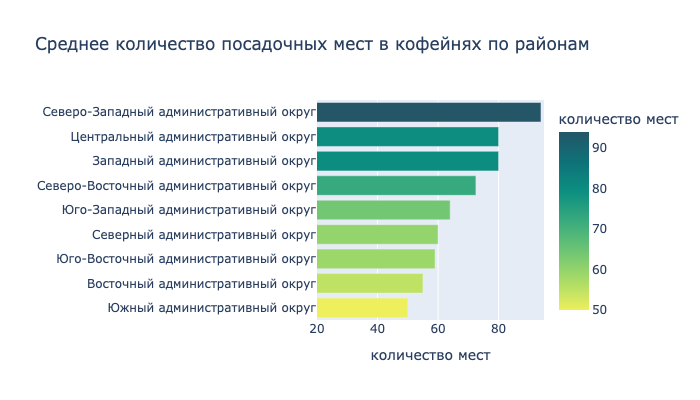

In [95]:
fig = px.bar(coffee_seats
             , x='seats', y='district'
             , color='seats'
             , color_continuous_scale= px.colors.sequential.Aggrnyl_r 
             , height=400
             , labels={
                     "district": "",
                     "seats": "количество мест",
                 },
                title="Среднее количество посадочных мест в кофейнях по районам")

fig.update_layout(xaxis=dict(range=[20, 95]))

fig.show()

Среднее количество посадочных мест в кофейнях среди районов находится в интервале от 50 до 95.

В тройке лидеров - СЗАО - 95 посадочных мест, ЦАО и ЗАО в среднем по 80 посадочных мест и СВАО - 72 места. В остальных округах количество мест в среднем от 50 до 62.

### Кофейный вывод

Обобщая проведенные исследования в отношении кофеен, была получена следующая информация: 

* В данных присутствует 1310 кофеен, из них 56 штук - круглосуточные.

* Абсолютное большинство кофеен находится в ЦАО - 400 штук. В остальных округах количество кофеен в 2-7 раз меньше.
* Иная картина наблюдается при сравнении относительного количества кофеен по округам - на первом месте - САО - 21%. Далее идет ЦАО - 19% и ЗАО/СВАО - по 18%.

* Среди круглосуточных кофеен - 22 штуки - расположены в центре города, остальные в районе вокзалов и крупных дорог. Единицы находятся внутри спальных районов. Малое количество круглосуточных кофеен можно объяснить дополнительными затратами и низкой посещаемостью в ночное время.

* Средний рейтинг кофеен по районам в целом одинаковый - во всех районах, кроме ЗАО, средний рейтинг 4.3, в ЗАО-4.2. То есть расположение на рейтинг не влияет.

* Самый дорогой кофе в юго-западной части москвы - 200 рублей за чашку капучино, немногим дешевле в центре и на западе - 185-190 рублей. Самый дешевый капучино на востоке и на юге Москвы- 135-140 рублей за чашку. В остальных районах - 150-165 рублей за чашку капучино.

* Среднее количество посадочных мест в кофейнях среди районов находится в интервале от 50 до 95. В тройке лидеров - СЗАО - 95 посадочных мест, ЦАО и ЗАО в среднем по 80 посадочных мест и СВАО - 72 места. В остальных округах количество мест в среднем от 50 до 62.

**Рекомендации**:

Поскольку заказчик хочет открыть в Москве кофейню, такую же крутую и доступную, как «Central Perk» из сериала "Друзья" и не боится конкуренции, то: 
* в качестве района для открытия рекомендуется **ЦАО** - район с самой высокой проходимостью людей. 
* круглосуточный режим работы выбирать **не рекомендуется**.
* рекомендованная цена для чашки капучино - 180-190 рублей.
* очарование кофейни из сериала вызывали такие качества как уют и камерность - количество посадочных мест рекомендуется выбрать ниже среднего, то есть до 80.

## Презентация

Презентация: <https://drive.google.com/file/d/1NJIQjcAlHBFYe0jNosQi_RHJSGgJBvNy/view?usp=sharing> 